---

<!-- Title and Subtitle -->
<div style="text-align: center;">
  <h1>Devoir individuel</h1>
  <h2>(Similarité à la base de la couleur)</h2>
</div>

---

<!-- Author and Date -->
<div style="text-align: center;">
  Réalisé par: DAGHMOUMI Marouan <br>
  Encadré par: Pr. M'hamed AIT KBIR <br>
  01 Novembre 2024
</div>


In [1]:
import json
import cv2
from sklearn.cluster import KMeans
from collections import Counter
from IPython.display import display, Image
from PIL import Image as PILImage
from io import BytesIO
import random
import numpy as np
from pathlib import Path

<!-- Title and Subtitle -->
<div style="text-align: left;">
  <h1>Partie 1 :</h1>
  <h2>Calcul caractéristique d'un dossier d'images</h2>
</div>


In [2]:
# Dictionary to store histogram data
histograms_data = {}

In [3]:
def calculate_display_histogram(image_path):
    """
    Calcule et affiche les histogrammes RGB d'une image dans une seule image dans Jupyter Notebook
    """
    # Lecture de l'image
    img = cv2.imread(str(image_path))
    # Conversion de BGR à RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Calcul des histogrammes pour chaque canal
    hist_r = cv2.calcHist([img_rgb], [0], None, [256], [0, 256])
    hist_g = cv2.calcHist([img_rgb], [1], None, [256], [0, 256])
    hist_b = cv2.calcHist([img_rgb], [2], None, [256], [0, 256])

    # Store histogram data in the global dictionary for saving later
    histograms_data[image_path.name] = {
        "R": hist_r.flatten().tolist(),
        "G": hist_g.flatten().tolist(),
        "B": hist_b.flatten().tolist()
    }
    
    # Création d'images pour chaque histogramme
    hist_img_r = np.zeros((300, 256, 3), dtype=np.uint8)
    hist_img_g = np.zeros((300, 256, 3), dtype=np.uint8)
    hist_img_b = np.zeros((300, 256, 3), dtype=np.uint8)

    for i in range(1, 256):
        cv2.line(hist_img_r, (i-1, 300 - int(hist_r[i-1][0])), (i, 300 - int(hist_r[i][0])), (0, 0, 255), 2)
        cv2.line(hist_img_g, (i-1, 300 - int(hist_g[i-1][0])), (i, 300 - int(hist_g[i][0])), (0, 255, 0), 2)
        cv2.line(hist_img_b, (i-1, 300 - int(hist_b[i-1][0])), (i, 300 - int(hist_b[i][0])), (255, 0, 0), 2)

    # Redimensionner l'image originale pour correspondre aux histogrammes
    img_resized = cv2.resize(img_rgb, (256, 300))
    
    # Combiner l'image originale et les histogrammes en une seule image
    combined_image = np.hstack((img_resized, hist_img_r, hist_img_g, hist_img_b))
    
    # Encode the combined image to PNG format for display in Jupyter Notebook
    _, combined_img_encoded = cv2.imencode('.png', combined_image)
    
    # Display the combined image
    display(Image(data=combined_img_encoded.tobytes()))


Traitement de l'image : 8982.jpg


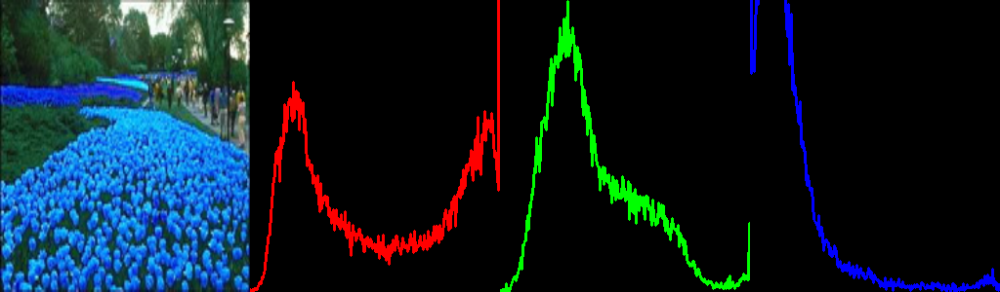


Traitement de l'image : 8189.jpg


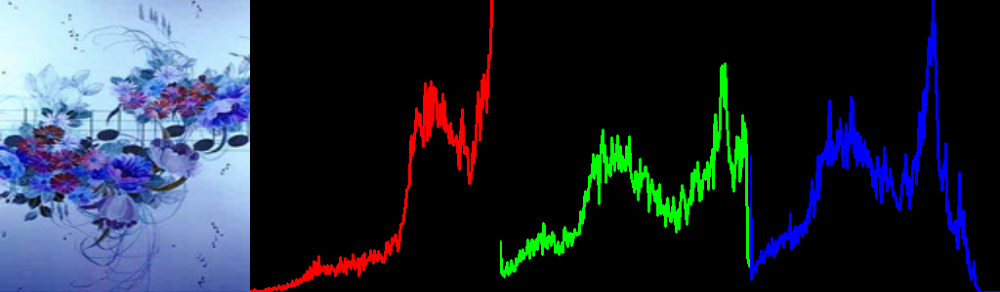


Traitement de l'image : 8994.jpg


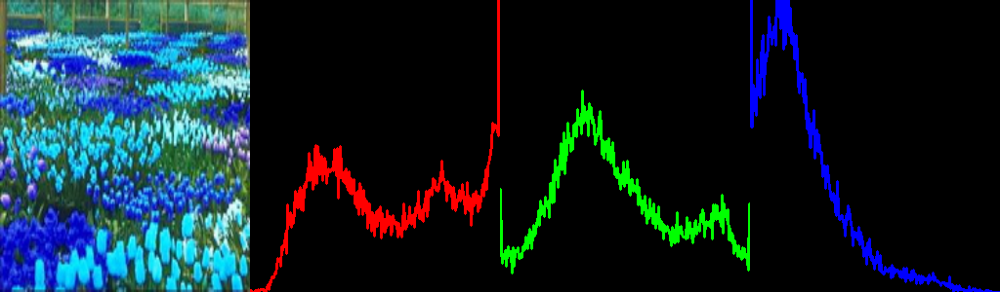


Traitement de l'image : 8980.jpg


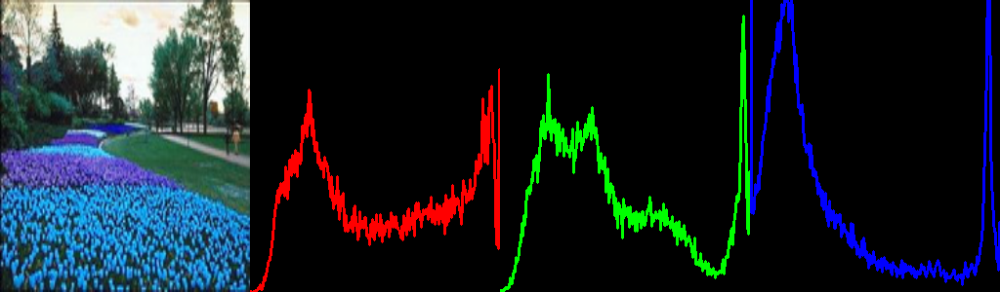


Traitement de l'image : 8200.jpg


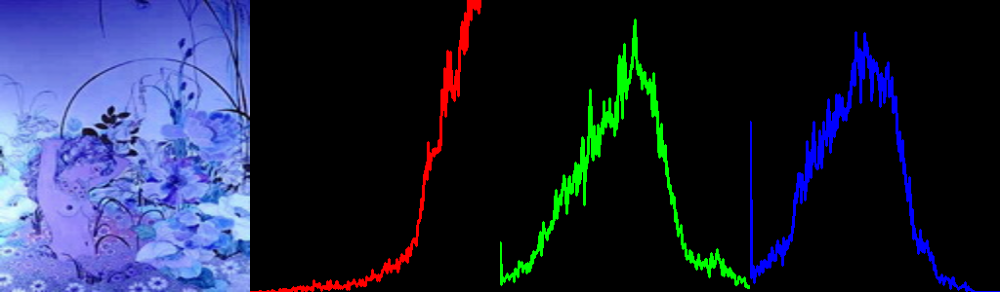


Traitement de l'image : 8990.jpg


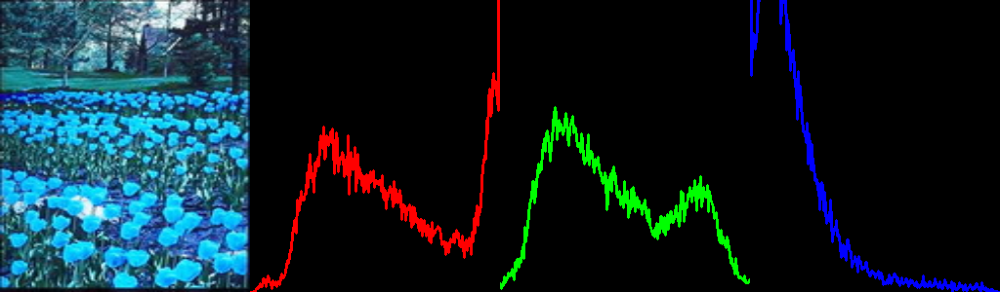


Traitement de l'image : 3409.jpg


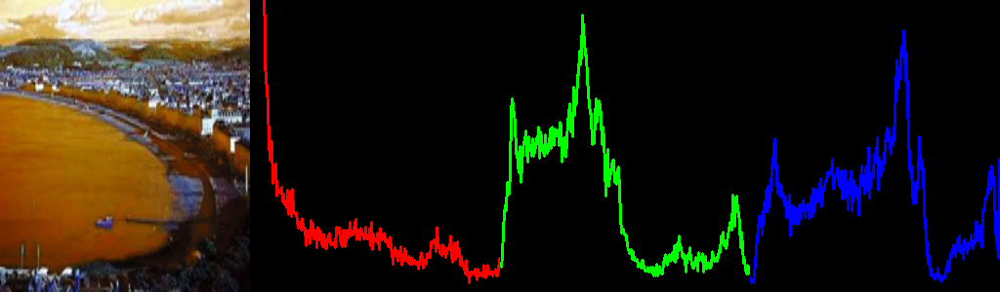


Traitement de l'image : 3408.jpg


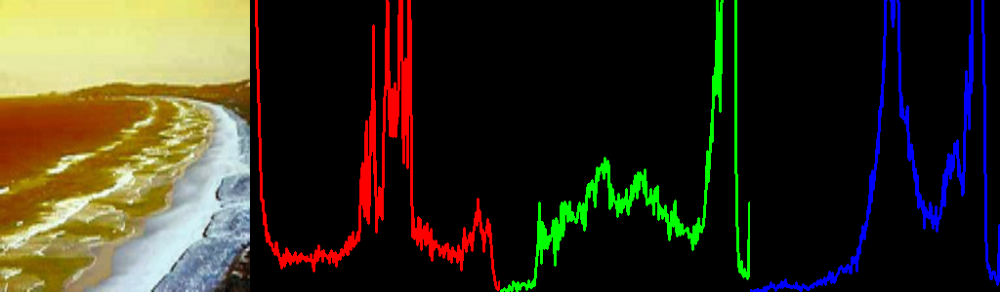


Traitement de l'image : 8116.jpg


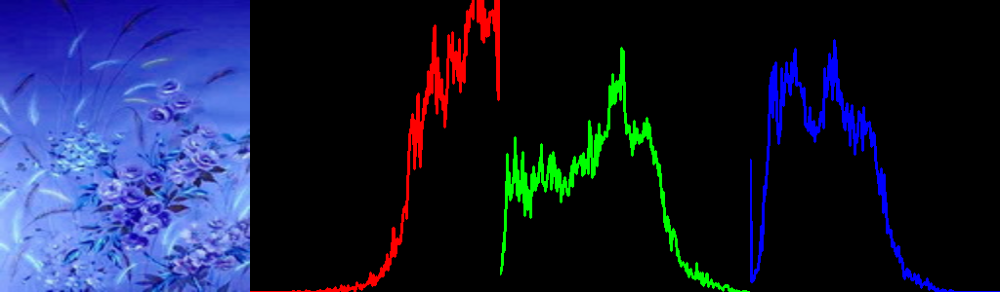


Traitement de l'image : 3486.jpg


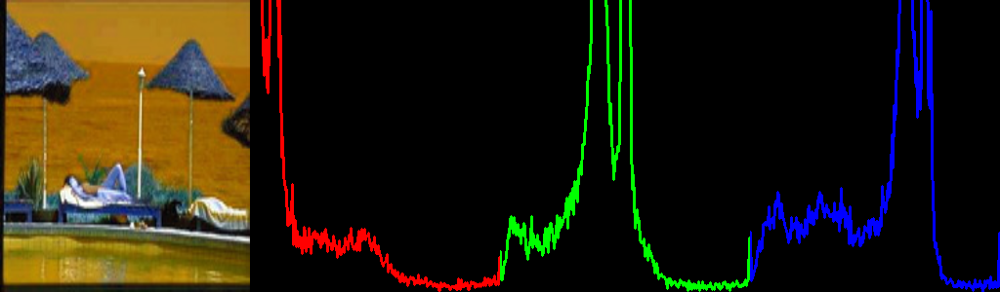


Traitement de l'image : 1468.jpg


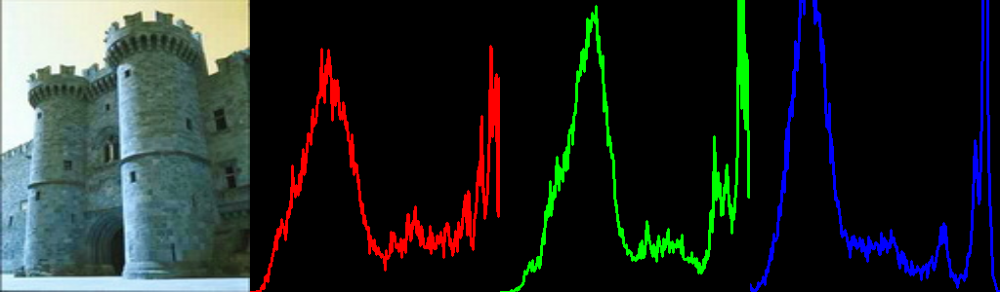


Traitement de l'image : 1479.jpg


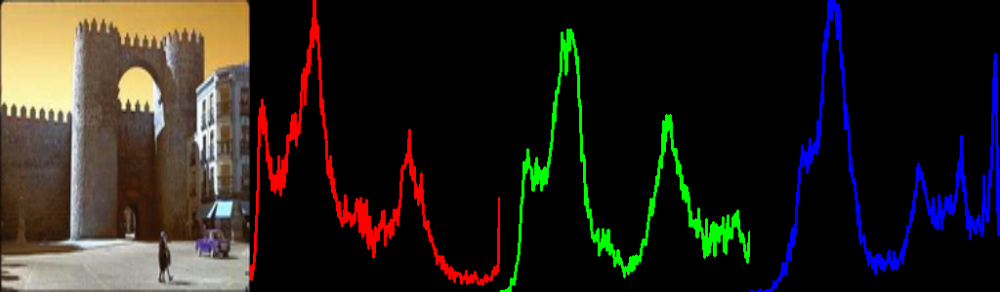


Traitement de l'image : 1484.jpg


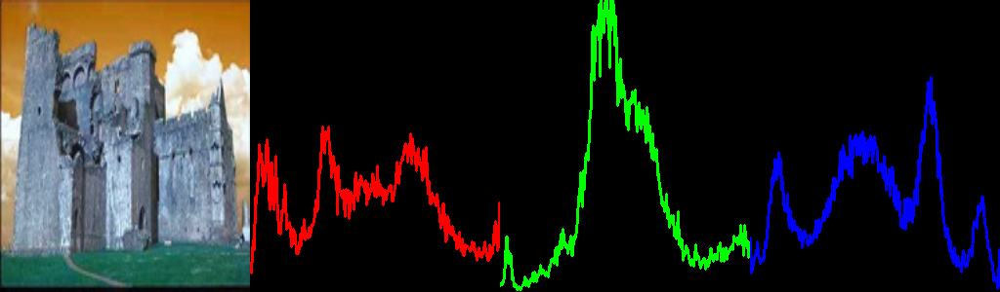


Traitement de l'image : 1488.jpg


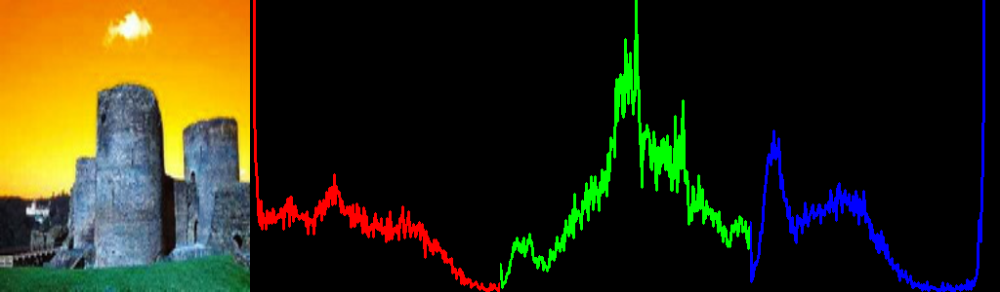


Traitement de l'image : 3448.jpg


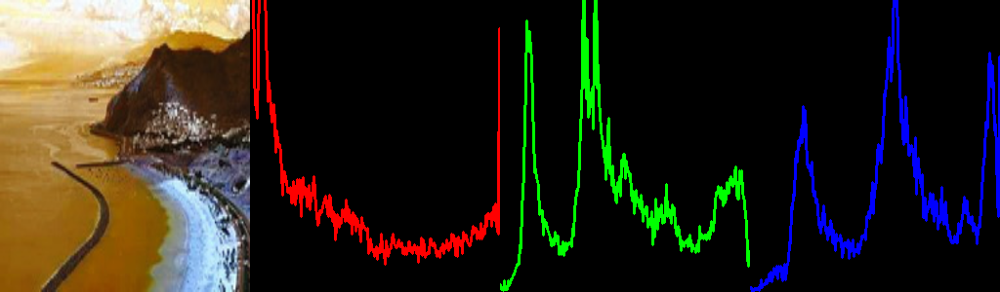


Traitement de l'image : 1472.jpg


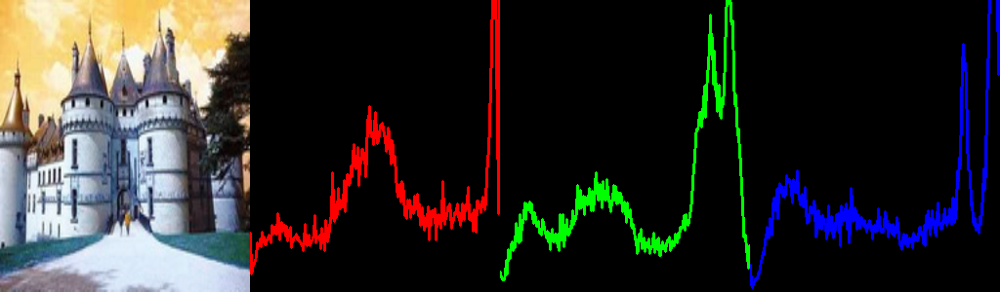


Traitement de l'image : 8185.jpg


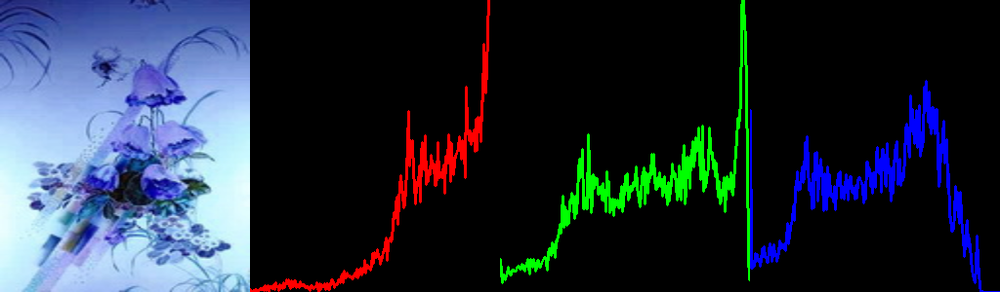


Traitement de l'image : 3402.jpg


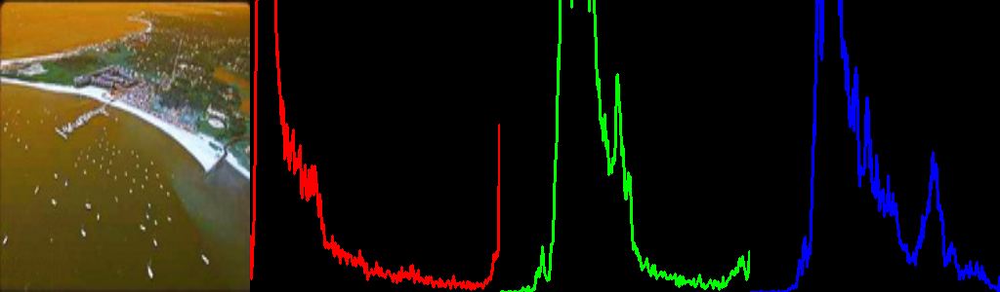


Traitement de l'image : 8186.jpg


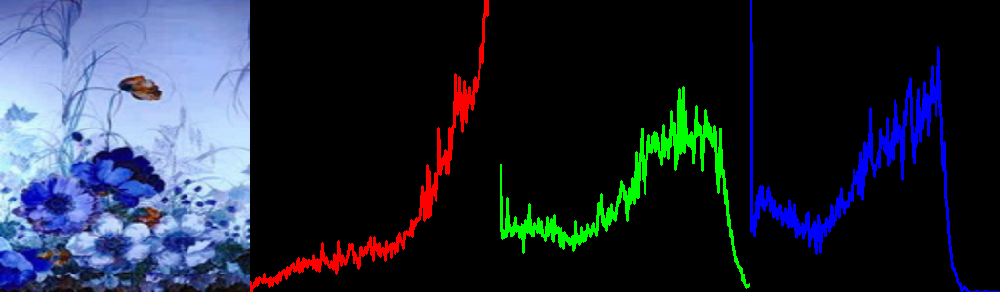


Traitement de l'image : 8965.jpg


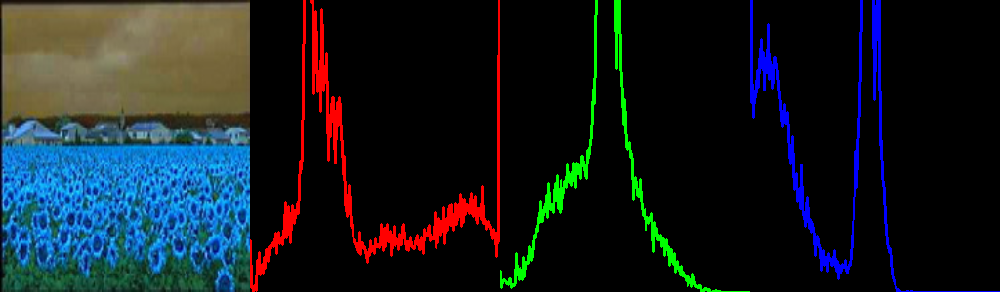

In [4]:
folder = Path("/Users/marouandgh/IdeaProjects/multi/Devoir_individuel/images(DVI1)")
# Liste des extensions d'images courantes
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp']
    
# Parcours des images dans le dossier
for img_path in folder.iterdir():
    if img_path.suffix.lower() in image_extensions:
        print(f"\nTraitement de l'image : {img_path.name}")
        calculate_display_histogram(img_path)

In [5]:
def calculate_dominant_colors(image_path, k=20, min_presence=0.95):
    """
    Calcule les couleurs dominantes d'une image avec un pourcentage minimum de présence.
    """
    # Lecture de l'image et conversion de BGR à RGB
    img = cv2.imread(str(image_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Redimensionner l'image pour accélérer le clustering
    img_resized = cv2.resize(img_rgb, (100, 100))
    img_data = img_resized.reshape(-1, 3)  # Conversion en 2D pour K-means
    
    # K-means clustering
    kmeans = KMeans(n_clusters=k, random_state=42).fit(img_data)
    labels = kmeans.labels_
    centers = kmeans.cluster_centers_.astype(int)
    
    # Calculer la fréquence de chaque cluster
    label_counts = Counter(labels)
    total_pixels = img_data.shape[0]
    
    # Filtrer les couleurs dominantes basées sur le seuil de présence
    dominant_colors = []
    cumulative_presence = 0
    for label, count in label_counts.most_common():
        presence = count / total_pixels
        cumulative_presence += presence
        if cumulative_presence <= min_presence:
            dominant_colors.append(centers[label].tolist())
        else:
            break
    
    # Store dominant colors in the global dictionary for saving later
    histograms_data[image_path.name]["dominant_colors"] = dominant_colors
    
    return dominant_colors

In [6]:
def display_image(image_path, dominant_colors):
    """
    Affiche l'image avec ses couleurs dominantes.
    """
    # Lecture de l'image
    img = cv2.imread(str(image_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Conversion BGR to RGB
    img_height, img_width = img_rgb.shape[:2]
    
    # Créer un swatch pour les couleurs dominantes avec une largeur ajustée
    swatch_height = 50
    swatch_width = img_width
    num_colors = len(dominant_colors)
    color_width = swatch_width // num_colors
    swatch = np.zeros((swatch_height, swatch_width, 3), dtype=np.uint8)
    
    for i, color in enumerate(dominant_colors):
        start_x = i * color_width
        end_x = start_x + color_width
        swatch[:, start_x:end_x] = color  # Remplir la section avec la couleur dominante
    
    # Combiner l'image et les couleurs dominantes
    combined_image = np.vstack((img_rgb, swatch))
    
    # Convertir en format PIL pour affichage dans Jupyter
    pil_img = PILImage.fromarray(combined_image)
    buffer = BytesIO()
    pil_img.save(buffer, format="PNG")
    display(Image(data=buffer.getvalue()))


Traitement de l'image : 8982.jpg


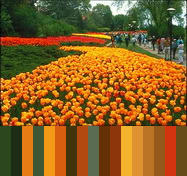


Traitement de l'image : 8189.jpg


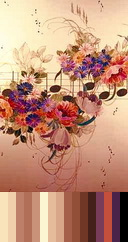


Traitement de l'image : 8994.jpg


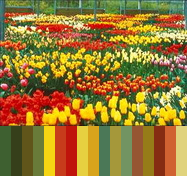


Traitement de l'image : 8980.jpg


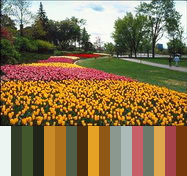


Traitement de l'image : 8200.jpg


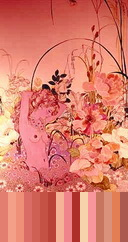


Traitement de l'image : 8990.jpg


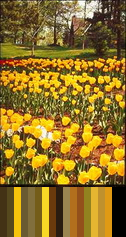


Traitement de l'image : 3409.jpg


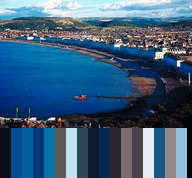


Traitement de l'image : 3408.jpg


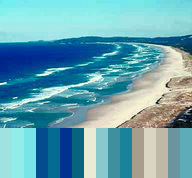


Traitement de l'image : 8116.jpg


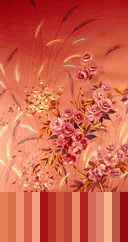


Traitement de l'image : 3486.jpg


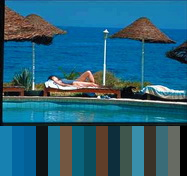


Traitement de l'image : 1468.jpg


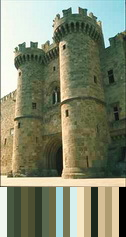


Traitement de l'image : 1479.jpg


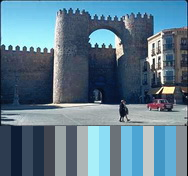


Traitement de l'image : 1484.jpg


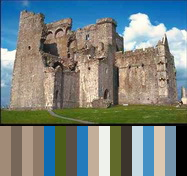


Traitement de l'image : 1488.jpg


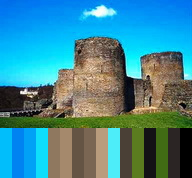


Traitement de l'image : 3448.jpg


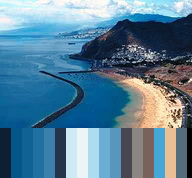


Traitement de l'image : 1472.jpg


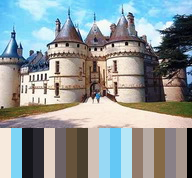


Traitement de l'image : 8185.jpg


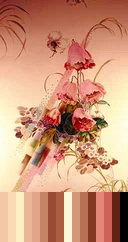


Traitement de l'image : 3402.jpg


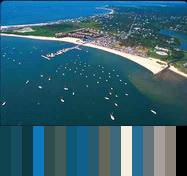


Traitement de l'image : 8186.jpg


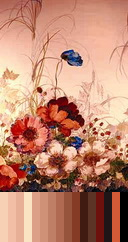


Traitement de l'image : 8965.jpg


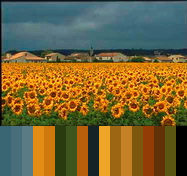

In [7]:
folder = Path("/Users/marouandgh/IdeaProjects/multi/Devoir_individuel/images(DVI1)")
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp']
    
for img_path in folder.iterdir():
     if img_path.suffix.lower() in image_extensions:
        print(f"\nTraitement de l'image : {img_path.name}")
        dominant_colors = calculate_dominant_colors(img_path, k=20, min_presence=0.95)
        display_image(img_path, dominant_colors)

In [8]:
def save_histograms(output_json='histograms.json'):
    """
    Sauvegarde les histogrammes et couleurs dominantes dans un fichier JSON.
    """
    with open(output_json, 'w', encoding='utf-8') as f:
        json.dump(histograms_data, f, indent=2)
    print(f"Histogrammes et couleurs dominantes sauvegardés dans {output_json}")

In [9]:
# Save results
save_histograms()

Histogrammes et couleurs dominantes sauvegardés dans histograms.json


<!-- Title and Subtitle -->
<div style="text-align: left;">
  <h1>Partie 2</h1>
  <h2>Calcul caractéristique d'un image aleatoire d'un dossier</h2>
</div>


In [10]:
def select_random_image(folder_path):
    # Convertir le chemin en objet Path
    folder = Path(folder_path)
    # Lister tous les fichiers d'images dans le dossier
    image_files = list(folder.glob("*.png"))
    if not image_files:
        print("Aucune image trouvée dans le dossier.")
        return None
    # Sélectionner une image aléatoire
    selected_image = random.choice(image_files)
    return selected_image

In [14]:
random_image = select_random_image("/Users/marouandgh/IdeaProjects/multi/Devoir_individuel/image")
if random_image is not None:
    print(f"Image aléatoire sélectionnée : {random_image.name}")

Image aléatoire sélectionnée : 524.png


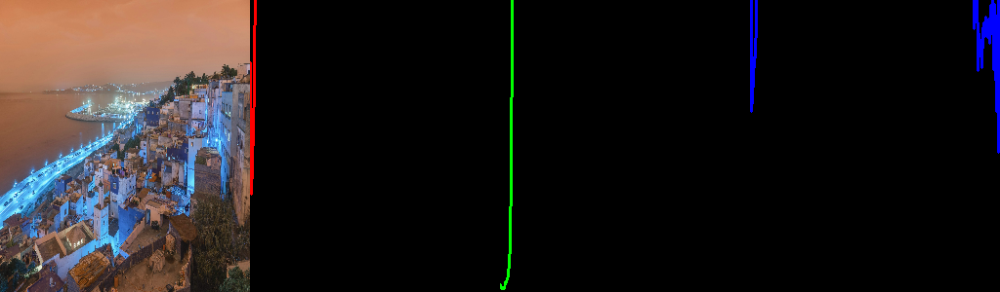

In [15]:
calculate_display_histogram(random_image)


Traitement de l'image : 524.png


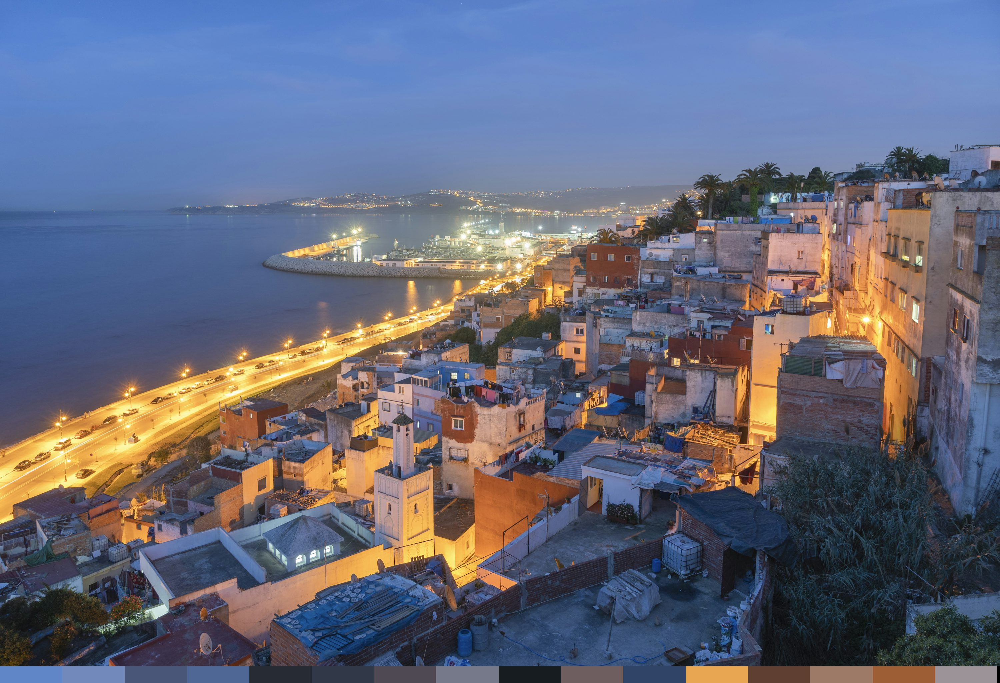

In [16]:
print(f"\nTraitement de l'image : {random_image.name}")
dominant_colors = calculate_dominant_colors(random_image, k=20, min_presence=0.95)
display_image(random_image, dominant_colors)

<!-- Title and Subtitle -->
<div style="text-align: left;">
  <h1>Partie 3</h1>
  <h2>Similarité à la base de la couleur</h2>
</div>


In [17]:
def add_image_to_data(image_path, data):
    """Add a new image's histogram and dominant colors to the data dictionary."""
    # First check if the image is already in the data
    if image_path.name in data:
        return data
    
    # Calculate histogram and dominant colors using your existing functions
    # We'll reuse the functions from your original code
    img = cv2.imread(str(image_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Calculate histograms
    hist_r = cv2.calcHist([img_rgb], [0], None, [256], [0, 256])
    hist_g = cv2.calcHist([img_rgb], [1], None, [256], [0, 256])
    hist_b = cv2.calcHist([img_rgb], [2], None, [256], [0, 256])
    
    # Calculate dominant colors
    dominant_colors = calculate_dominant_colors(image_path)
    
    # Add to data dictionary
    data[image_path.name] = {
        "R": hist_r.flatten().tolist(),
        "G": hist_g.flatten().tolist(),
        "B": hist_b.flatten().tolist(),
        "dominant_colors": dominant_colors
    }
    
    return data

In [18]:
def load_histogram_data(json_file='histograms.json'):
    """Load histogram and dominant colors data from JSON file."""
    with open(json_file, 'r') as f:
        return json.load(f)

In [19]:
def calculate_histogram_distance(hist1, hist2):
    """Calculate Chi-Square distance between two histograms."""
    # Convert lists to numpy arrays
    h1 = np.array(hist1)
    h2 = np.array(hist2)
    
    # Avoid division by zero by adding small epsilon
    eps = 1e-10
    # Calculate Chi-Square distance
    return np.sum((h1 - h2) ** 2 / (h1 + h2 + eps)) / 2

def calculate_color_distance(colors1, colors2):
    """Calculate average Euclidean distance between two sets of dominant colors."""
    # Ensure we have the same number of colors to compare
    min_len = min(len(colors1), len(colors2))
    colors1 = colors1[:min_len]
    colors2 = colors2[:min_len]
    
    # Convert to numpy arrays
    c1 = np.array(colors1)
    c2 = np.array(colors2)
    
    # Calculate Euclidean distance between corresponding colors
    distances = np.sqrt(np.sum((c1 - c2) ** 2, axis=1))
    return np.mean(distances)

In [20]:
def compare_images(data, random_image_path):
    """Compare random image with all other images in the dataset."""
    # First ensure the random image data is in our dataset
    data = add_image_to_data(random_image_path, data)
    
    results = []
    random_image_data = data[random_image_path.name]
    
    for image_name, image_data in data.items():
        if image_name == random_image_path.name:
            continue
            
        # Calculate histogram distance (average of R, G, B channels)
        hist_distance = (
            calculate_histogram_distance(random_image_data['R'], image_data['R']) +
            calculate_histogram_distance(random_image_data['G'], image_data['G']) +
            calculate_histogram_distance(random_image_data['B'], image_data['B'])
        ) / 3
        
        # Calculate dominant colors distance
        color_distance = calculate_color_distance(
            random_image_data['dominant_colors'],
            image_data['dominant_colors']
        )
        
        # Calculate global distance (weighted average)
        global_distance = 0.5 * hist_distance + 0.5 * color_distance
        
        results.append({
            'image_name': image_name,
            'histogram_distance': hist_distance,
            'color_distance': color_distance,
            'global_distance': global_distance
        })
    
    # Sort results by global distance
    results.sort(key=lambda x: x['global_distance'])
    return results

In [21]:
# Load the data and perform comparison
data = load_histogram_data()
results = compare_images(data, random_image)

# Display results
print(f"\nComparison results for {random_image.name}:")
print("-" * 80)
for result in results:
    print(f"\nComparison with {result['image_name']}:")
    print(f"Histogram distance: {result['histogram_distance']:.2f}")
    print(f"Dominant color distance: {result['color_distance']:.2f}")
    print(f"Global distance: {result['global_distance']:.2f}")


Comparison results for 524.png:
--------------------------------------------------------------------------------

Comparison with 8200.jpg:
Histogram distance: 2963993.31
Dominant color distance: 141.38
Global distance: 1482067.35

Comparison with 8116.jpg:
Histogram distance: 2964383.75
Dominant color distance: 144.87
Global distance: 1482264.31

Comparison with 8189.jpg:
Histogram distance: 2964408.82
Dominant color distance: 142.39
Global distance: 1482275.61

Comparison with 8186.jpg:
Histogram distance: 2964685.50
Dominant color distance: 141.55
Global distance: 1482413.52

Comparison with 8185.jpg:
Histogram distance: 2964698.67
Dominant color distance: 161.94
Global distance: 1482430.31

Comparison with 1484.jpg:
Histogram distance: 2965467.31
Dominant color distance: 133.93
Global distance: 1482800.62

Comparison with 1479.jpg:
Histogram distance: 2965753.40
Dominant color distance: 139.82
Global distance: 1482946.61

Comparison with 3402.jpg:
Histogram distance: 2965976.55
Do

In [22]:
def sort_and_display_distances(results):
    """
    Trie et affiche les distances par type (histogramme, couleur, globale) dans l'ordre croissant.
    """
    # Créer des listes triées pour chaque type de distance
    histogram_sorted = sorted(results, key=lambda x: x['histogram_distance'])
    color_sorted = sorted(results, key=lambda x: x['color_distance'])
    global_sorted = sorted(results, key=lambda x: x['global_distance'])
    
    # Afficher les résultats triés par distance histogramme
    print("\n=== Images triées par distance d'histogramme (croissant) ===")
    print("{:<15} {:<20}".format("Image", "Distance histogramme"))
    print("-" * 35)
    for item in histogram_sorted:
        print("{:<15} {:<20.2f}".format(item['image_name'], item['histogram_distance']))
    
    # Afficher les résultats triés par distance de couleur
    print("\n=== Images triées par distance de couleur dominante (croissant) ===")
    print("{:<15} {:<20}".format("Image", "Distance couleur"))
    print("-" * 35)
    for item in color_sorted:
        print("{:<15} {:<20.2f}".format(item['image_name'], item['color_distance']))
    
    # Afficher les résultats triés par distance globale
    print("\n=== Images triées par distance globale (croissant) ===")
    print("{:<15} {:<20}".format("Image", "Distance globale"))
    print("-" * 35)
    for item in global_sorted:
        print("{:<15} {:<20.2f}".format(item['image_name'], item['global_distance']))
    
    # Retourner les résultats triés au cas où on en aurait besoin ailleurs
    return {
        'histogram_sorted': histogram_sorted,
        'color_sorted': color_sorted,
        'global_sorted': global_sorted
    }

In [23]:
def find_most_similar_images(results, top_n=3):
    """
    Trouve les N images les plus similaires selon chaque critère.
    """
    # Trier les résultats pour chaque métrique
    histogram_sorted = sorted(results, key=lambda x: x['histogram_distance'])
    color_sorted = sorted(results, key=lambda x: x['color_distance'])
    global_sorted = sorted(results, key=lambda x: x['global_distance'])
    
    print(f"\n=== Top {top_n} images les plus similaires ===")
    
    print("\nPar distance globale:")
    for i, item in enumerate(global_sorted[:top_n], 1):
        print(f"{i}. {item['image_name']} (distance: {item['global_distance']:.2f})")

In [24]:
# Utilisation avec vos résultats existants
print(f"\nAnalyse de similarité pour l'image: {random_image.name}")
print("=" * 50)
# Trier et afficher tous les résultats
sorted_results = sort_and_display_distances(results)


Analyse de similarité pour l'image: 524.png

=== Images triées par distance d'histogramme (croissant) ===
Image           Distance histogramme
-----------------------------------
8200.jpg        2963993.31          
8116.jpg        2964383.75          
8189.jpg        2964408.82          
8186.jpg        2964685.50          
8185.jpg        2964698.67          
1484.jpg        2965467.31          
1479.jpg        2965753.40          
3402.jpg        2965976.55          
3448.jpg        2966245.32          
8994.jpg        2966551.73          
8980.jpg        2966585.81          
1468.jpg        2966640.66          
8965.jpg        2966834.87          
8990.jpg        2967100.59          
1472.jpg        2967159.17          
8982.jpg        2967409.27          
3409.jpg        2969599.11          
3486.jpg        2969928.63          
3408.jpg        2970226.27          
1488.jpg        2974971.59          

=== Images triées par distance de couleur dominante (croissant) ===
Image      

In [25]:
# Afficher les top 3 images les plus similaires
find_most_similar_images(results, top_n=3)


=== Top 3 images les plus similaires ===

Par distance globale:
1. 8200.jpg (distance: 1482067.35)
2. 8116.jpg (distance: 1482264.31)
3. 8189.jpg (distance: 1482275.61)


In [30]:
def display_similar_images(results, reference_image_path, folder_path, top_n=3):
    # Trier les résultats par distance globale
    sorted_results = sorted(results, key=lambda x: x['global_distance'])[:top_n]
    
    # Charger l'image de référence
    reference_img = cv2.imread(str(reference_image_path))
    reference_img = cv2.cvtColor(reference_img, cv2.COLOR_BGR2RGB)
    
    # Redimensionner l'image de référence à une taille standard
    target_width = 400
    aspect_ratio = reference_img.shape[1] / reference_img.shape[0]
    target_height = int(target_width / aspect_ratio)
    reference_img = cv2.resize(reference_img, (target_width, target_height))
    
    # Créer l'espace pour le texte
    text_height = 60
    reference_with_text = np.zeros((target_height + text_height, target_width, 3), dtype=np.uint8)
    reference_with_text[0:target_height, :] = reference_img
    
    # Ajouter le texte pour l'image de référence
    cv2.putText(reference_with_text, "Image de reference", 
                (10, target_height + 30), cv2.FONT_HERSHEY_SIMPLEX, 
                0.7, (255, 255, 255), 2)
    
    # Préparer les images similaires
    similar_images = []
    for idx, result in enumerate(sorted_results, 1):
        img_path = folder_path / result['image_name']
        if img_path.exists():
            # Charger l'image similaire
            img = cv2.imread(str(img_path))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            # Redimensionner à la même taille que l'image de référence
            img = cv2.resize(img, (target_width, target_height))
            
            # Créer l'espace pour le texte
            img_with_text = np.zeros((target_height + text_height, target_width, 3), dtype=np.uint8)
            img_with_text[0:target_height, :] = img
            
            # Ajouter les métriques
            text = f"#{idx} Score: {result['global_distance']:.2f}"
            cv2.putText(img_with_text, text,
                       (10, target_height + 30), cv2.FONT_HERSHEY_SIMPLEX, 
                       0.7, (255, 255, 255), 2)
            
            similar_images.append(img_with_text)
    
    # Concaténer toutes les images horizontalement
    all_images = [reference_with_text] + similar_images
    final_display = np.hstack(all_images)
    
    # Afficher avec matplotlib
    plt.figure(figsize=(20, 5))
    plt.imshow(final_display)
    plt.axis('off')
    plt.show()
    
    return sorted_results

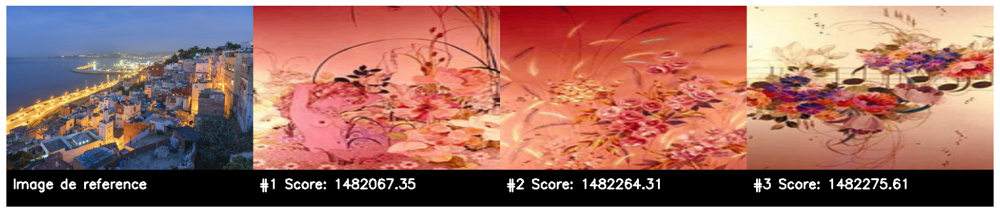

In [31]:
 folder_path = Path("/Users/marouandgh/IdeaProjects/multi/Devoir_individuel/images(DVI1)")
similar_images = display_similar_images(results, random_image, folder_path, top_n=3)